# Part 5 - Data Analysis

## Imports and data loading

### Imports

In [0]:
!pip install hdbscan

  Using cached hdbscan-0.8.33-cp39-cp39-linux_x86_64.whl
You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-7d826979-1588-48f4-aac4-673bbc9fab17/bin/python -m pip install --upgrade pip' command.


In [0]:
# pyspark
from pyspark.sql.types import *
import pyspark
from pyspark.sql import SparkSession
from pyspark.sql import functions as F
from pyspark.sql.functions import udf
from pyspark.sql.functions import col
from pyspark.sql.functions import split, explode
from pyspark.sql import Window
from pyspark.ml.feature import StringIndexer, VectorAssembler, PCA
import pyspark.ml.feature as ftr
from pyspark.ml.linalg import Vectors, VectorUDT
from pyspark.ml import Pipeline

# nlp
import sparknlp
from sparknlp.base import *
from sparknlp.annotator import *
import nltk
from nltk import pos_tag
from nltk.tokenize import word_tokenize
import nltk.stem
from nltk.corpus import stopwords

# for visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import colorsys
from scipy.spatial import ConvexHull
from scipy.interpolate import interp1d

# python standard libraries
from statistics import mean, variance
from math import log10, sqrt
from operator import add
from functools import reduce
import builtins
import pickle
import time
from collections import defaultdict, Counter
import os
import string
import warnings
import random
from pathlib import Path
import joblib
import ast

# for clustering
from scipy.spatial import distance
import sklearn.cluster
from sklearn.cluster import OPTICS
from sklearn.manifold import TSNE
from sklearn import metrics
import hdbscan

# options
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)

# downloads
nltk.download("wordnet")
pretrained_embeddings = BertSentenceEmbeddings.pretrained('sent_bert_multi_cased', 'xx')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
sent_bert_multi_cased download started this may take some time.
Approximate size to download 638.6 MB
[OK!]


In [0]:
# our functions for the project
from part_5_packages.clustering_functions import *
from part_5_packages.embedding_functions import *
from part_5_packages.udf_functions import *
from part_5_packages.files_operating_utils import *

In [0]:
spark = SparkSession.builder.getOrCreate()

### Data Loading

In [0]:
# Change to the path the parsed jobs pickle is. Alternatively, you can load the parsed jobs dataframe that is compatible with the code
# (see the dataframe structure in the cell below)
jobs_pickle_path = "/Workspace/Users/vladklim@campus.technion.ac.il/Project/jobs_parsed_dict.pickle"
with open(jobs_pickle_path, "rb") as f:
    jobs_dict = pickle.load(f)

In [0]:
# Creating a jobs dataframe from the jobs dictionary
renamed_job_keys = {
    'Job Title and Summary': "title_and_summary",
    'Company Overview': "company_overview",
    'Job Responsibilities': "responsibilities",
    'Qualifications and Skills': "qualifications_and_skills",
    'Required Education': "education",
    'Benefits and Perks': "benefits",
    'Application Process': "application",
    'Contact Information': "contact_info"
    }

other_keys = ['title', 'description', 'location', 'post_time', 'criterias', 'url', 'datetime', 'benefits']

inner_schema = StructType([
    StructField(renamed_job_keys["Job Title and Summary"], StringType(), True),
    StructField(renamed_job_keys["Company Overview"], StringType(), True),
    StructField(renamed_job_keys["Job Responsibilities"], ArrayType(StringType()), True),
    StructField(renamed_job_keys["Qualifications and Skills"], ArrayType(StringType()), True),
    StructField(renamed_job_keys["Required Education"], StringType(), True),
    StructField(renamed_job_keys["Benefits and Perks"], ArrayType(StringType()), True),
    StructField(renamed_job_keys["Application Process"], StringType(), True),
    StructField(renamed_job_keys["Contact Information"], StringType(), True),
    *[StructField(key, StringType(), True) for key in other_keys]
])

outer_schema = StructType([
    StructField("url", StringType(), False),
    StructField("jobs_parsed", ArrayType(inner_schema), False)
])

jobs_parsed_df = spark.createDataFrame([(url, jobs_list) for url, jobs_list in jobs_dict.items()], ["url", "jobs_parsed"], outer_schema)


In [0]:
# Join the jobs info with the related companies. Olny companies with jobs will remain
companies = spark.read.parquet('/linkedin/companies')
tech_comps = companies.join(jobs_parsed_df, ("url"), "inner")

In [0]:
# Some jobs statistical summary, by industry
tech_comps.withColumn("jobs_number", F.size(F.col("jobs_parsed"))).select("industries", "jobs_number").groupby("industries").agg(F.sum("jobs_number"), F.count("jobs_number")).withColumn("mean_jobs_per_company", F.round(F.col("sum(jobs_number)") / F.col("count(jobs_number)"), 1)).display()

industries,sum(jobs_number),count(jobs_number),mean_jobs_per_company
Software Development,3214,383,8.4
Computer Hardware Manufacturing,128,10,12.8
E-Learning Providers,202,24,8.4
Automation Machinery Manufacturing,298,49,6.1
Computer and Network Security,252,33,7.6
"Technology, Information and Internet",256,31,8.3
IT Services and IT Consulting,4982,473,10.5
Telecommunications,872,71,12.3
Computer Networking Products,4,2,2.0


## Jobs dataframe of tech companies

In [0]:
tech_jobs_df = tech_comps.withColumn("job", F.explode("jobs_parsed")) \
                    .drop("jobs_parsed") \
                    .withColumns({'index': F.monotonically_increasing_id(),
                                  'title': F.col("job.title"), 
                                  'quals_and_skills': F.col("job.qualifications_and_skills"),
                                #   'education': F.col("job.education"),
                                #   'responsibilities': F.col("job.responsibilities"),
                                #   'benefits': F.col('job.benefits'),
                                #   'post_date': F.col('job.datetime'),
                                #   'location': F.col("job.location"),
                                  'criterias': F.col("job.criterias"),
                                  'url': F.col("job.url"),
                                  'company_url': F.col("url")
                                  }) \
                    .selectExpr("index", "title", "industries", "quals_and_skills", "criterias", "company_size", "name as comp_name", 
                                "organization_type as org_type", "company_url", "url")

In [0]:
tech_jobs_df = tech_jobs_df.withColumn("job_functions", extract_job_function(F.col("criterias"))) \
                        .withColumn("job_functions_array", split_job_functions(F.col("job_functions"))) \
                        .drop("criterias")

### Extracting jobs functions from Criterias column - for clusters labeling<br>
(manual labeling version - didn't help by the way, because the job functions didn't represent well the clusters we obtained, but we used it for meta info in the final visualization)

In [0]:
tech_job_functions = Counter([row.job_function for row in tech_jobs_df.select("job_functions_array") \
                                    .withColumn("job_function", F.explode("job_functions_array")).collect()])

@udf (StringType())
def main_job_function(functions):
    return max(functions, key=lambda k: tech_job_functions[k])

In [0]:
tech_jobs_df = tech_jobs_df.withColumn("main_job_function", main_job_function(F.col("job_functions_array")))
tech_jobs_df.persist()

Out[78]: DataFrame[index: bigint, title: string, industries: string, quals_and_skills: string, company_size: string, comp_name: string, org_type: string, company_url: string, url: string, job_functions: string, job_functions_array: array<string>, main_job_function: string]

In [0]:
tech_jobs_df.display()

index,title,industries,quals_and_skills,company_size,comp_name,org_type,company_url,url,job_functions,job_functions_array,main_job_function
0,Senior Data Engineer,Software Development,"[SQL, NoSQL, Python, R, data modeling, data mining, data warehousing, machine learning, data lakes, big data infrastructure, Hadoop, AWS, Docker, communication, problem solving]",51-200 employees,Camgian,Privately Held,https://www.linkedin.com/company/camgian,https://www.linkedin.com/jobs/view/senior-data-engineer-at-camgian-3847577523?position=4&pageNum=0&refId=hB9wocazTM6pqNHq66XNqg%3D%3D&trackingId=SP2vo4X4aOZ49gadigxZvg%3D%3D&trk=public_jobs_jserp-result_search-card,Information Technology,List(Information Technology),Information Technology
1,Senior AI Engineer,Software Development,"[Bachelor’s Degree (Computer Science, Computer Engineering, Statistics, or Mathematics), Proficiency in Python, Strong Knowledge in AI, ML, and DL, Experience developing, training, and validating AI models, 5+ years progressive professional experience, United States Citizenship]",51-200 employees,Camgian,Privately Held,https://www.linkedin.com/company/camgian,https://www.linkedin.com/jobs/view/senior-ai-engineer-at-camgian-3847572912?position=2&pageNum=0&refId=hB9wocazTM6pqNHq66XNqg%3D%3D&trackingId=wofi8tkL%2BuVFYARCQymwWQ%3D%3D&trk=public_jobs_jserp-result_search-card,Engineering,List(Engineering),Engineering
2,Product Technical Manager,Software Development,"[Expertise and hands-on experience with system architecture in hardware and/or software applications, Understanding capabilities, limitations, and tradeoffs of technologies across engineering subject matters, Demonstrated experience in translating customer needs to system definition of features and design specs, Demonstrated ability to coordinate with cross-functional teams to define product system architectures, Demonstrated ability to identify and manage product and program technical risks, Demonstrated experience in product implementation, Experience with integration constraints, troubleshooting, diagnosis, and solutions, Experience in the following areas are strongly desired., Performance limitations and tradeoffs of variety of hardware processing platforms, Understanding of physical data interfaces and their tradeoffs (e.g. USB, serial, embedded camera interface), Knowledge of various sensor modalities (e.g. EO/IR (LW/MW/SW/NIR), acoustic, magnetic, passive RF, active RF) and modeling of these modalities, Knowledge of algorithms/DSP/AI/ML (e.g. signal processing including traditional, statistical, image/video; feature extraction, natural language processing, machine learning concepts (model training, network architectures / complexity, performance expectations, data science including data mining)]",51-200 employees,Camgian,Privately Held,https://www.linkedin.com/company/camgian,https://www.linkedin.com/jobs/view/product-technical-manager-at-camgian-3847575454?position=1&pageNum=0&refId=hB9wocazTM6pqNHq66XNqg%3D%3D&trackingId=rQI4sG9fV3ud0qGeMv7egA%3D%3D&trk=public_jobs_jserp-result_search-card,"Product Management, Engineering, and Strategy/Planning","List(Product Management, Engineering, Strategy/Planning)",Engineering
3,Senior Software Engineer,Software Development,"[Bachelor’s degree in Computer Science, Software Engineering, or Computer Engineering., Proficiency in Java, JavaScript, Python, SQL, Linux., Experience with UI/UX design and development., Experience in DevOps tools (Jira, Git, Jenkins, Artifactory)., Experience in Software Development Life Cycle Processes and Agile Methodologies., 5+ years of software development experience., United States Citizenship.]",51-200 employees,Camgian,Privately Held,https://www.linkedin.com/company/camgian,https://www.linkedin.com/jobs/view/senior-software-engineer-at-camgian-3847572955?position=3&pageNum=0&refId=hB9wocazTM6pqNHq66XNqg%3D%3D&trackingId=%2B3novXO1tDKC%2FXR9%2FRLfZg%3D%3D&trk=public_jobs_jserp-result_search-card,Engineering,List(Engineering),Engin

## Job Positions Titles Embedding and HDBSCAN Clustering

### Embedding and Clustering

In [0]:
categories = ["all"]
categories_dict = {"all": tech_jobs_df.selectExpr("index", "title as sentence", "industries", "comp_name",
                                                  "job_functions", "main_job_function", "company_url", "url")}
titles_embeddings_dict = get_sentence_embeddings_dict(categories_dict, pretrained_embeddings, cache=True, lower=False,
                            prep_pipeline=[remove_between_brackets, remove_non_english_chars, filter_nouns_adjectives])

In [0]:
titles_clusters, titles_clusterer = hdbscan_clustering(titles_embeddings_dict["all"], spark, metric='euclidean', min_samples=2, 
                    min_cluster_size=3, cluster_selection_method='leaf', cluster_selection_epsilon=0, 
                    prediction_data=True, pca=False, pca_k=200)
titles_clusters.persist()

Silhouette score: -0.17845705119672733
Calinski-Harabasz score: 3.910243442581354
Davies-Bouldin score: 1.738006946136574
DBCV relative score: 0.0546365506579159
Number of clusters: 261
Number of unique sentences clustered: 1279
Out[14]: DataFrame[embedding: vector, index: bigint, sentence: string, industries: string, comp_name: string, job_functions: string, main_job_function: string, company_url: string, url: string, sentence_cleaned: string, cluster: bigint, soft_cluster: bigint, probability: double, soft_probability: double]

### Saving The Clusterer Model

In [0]:
joblib.dump(titles_clusterer, "/Workspace/Users/vladklim@campus.technion.ac.il/Project/models/titles_clusterer.joblib")

Out[15]: ['/Workspace/Users/vladklim@campus.technion.ac.il/Project/models/titles_clusterer.joblib']

In [0]:
titles_clusters_layered = create_layers(titles_clusters, spark, min_=1, start_from=0, min_word_len=3)

In [0]:
titles_clusters_layered.select("cluster", "soft_cluster", "layer_4", "layer_3", "layer_2", "layer_1", "layer_0") \
                        .orderBy(F.col("layer_4"), F.desc("soft_cluster")).display()


cluster,soft_cluster,layer_4,layer_3,layer_2,layer_1,layer_0
-1,249,account,"account, enterprise","account, enterprise, executive","account, enterprise, executive, sale","account, enterprise, executive, sale, manager"
-1,249,account,"account, enterprise","account, enterprise, executive","account, enterprise, executive, sale","account, enterprise, executive, sale, manager"
-1,249,account,"account, enterprise","account, enterprise, executive","account, enterprise, executive, sale","account, enterprise, executive, sale, manager"
-1,249,account,"account, enterprise","account, enterprise, executive","account, enterprise, executive, sale","account, enterprise, executive, sale, manager"
-1,249,account,"account, enterprise","account, enterprise, executive","account, enterprise, executive, sale","account, enterprise, executive, sale, manager"
-1,249,account,"account, enterprise","account, enterprise, executive","account, enterprise, executive, sale","account, enterprise, executive, sale, manager"
249,249,account,"account, enterprise","account, enterprise, executive","account, enterprise, executive, sale","account, enterprise, executive, sale, manager"
-1,249,account,"account, enterprise","account, enterprise, executive","account, enterprise, executive, sale","account, enterprise, executive, sale, manager"
-1,249,account,"account, enterprise","account, enterprise, executive","account, enterprise, executive, sale","account, enterprise, executive, sale, manager"
-1,249,account,"account, enterprise","account, enterprise, executive","account, enterprise, executive, sale","account, enterprise, executive, sale, manager"


In [0]:
print(titles_clusters_layered.select("soft_cluster").distinct().count())
print(titles_clusters_layered.select("layer_0").distinct().count())
print(titles_clusters_layered.select("layer_1").distinct().count())
print(titles_clusters_layered.select("layer_2").distinct().count())
print(titles_clusters_layered.select("layer_3").distinct().count())
print(titles_clusters_layered.select("layer_4").distinct().count())

261
261
261
258
231
112


In [0]:
titles_clusters_tsne = get_tsne_embeddings(titles_clusters_layered, spark, perplexity=50, metric="euclidean")

#### Saving titles clustering data to pickle (for future interactive visualization)

In [0]:
def save_vis_data(df, name):
    data = {}
    data["layers"] = [df.select(f"layer_{i}").rdd.map(lambda x: x[f"layer_{i}"]).collect() for i in range(5)]
    data["layers"].append(df.select("job_functions").rdd.map(lambda x: x["job_functions"]).collect())
    data["layers"].append(df.select("main_job_function").rdd.map(lambda x: x["main_job_function"]).collect())
    data["tsne"] = df.select(f"vector_TSNE").rdd.map(lambda x: np.array(x["vector_TSNE"])).collect()
    data["soft_clusters"] = df.select(f"soft_cluster").rdd.map(lambda x: x["soft_cluster"]).collect()
    data["soft_probs"] = df.select(f"soft_probability").rdd.map(lambda x: x["soft_probability"]).collect()
    data["sentences"] = df.select(f"sentence").rdd.map(lambda x: x["sentence"]).collect()
    data["sentences_cleaned"] = df.select(f"sentence_cleaned").rdd.map(lambda x: x["sentence_cleaned"]).collect()
    data["company_name"] = df.select(f"comp_name").rdd.map(lambda x: x["comp_name"]).collect()
    data["url"] = df.select(f"url").rdd.map(lambda x: x["url"]).collect()
    save_to_pickle(data, f"{name}.pickle")

In [0]:
save_vis_data(titles_clusters_tsne, "titles_data")

## Skills and Qualifications: Preprocessing, Embedding, Sampling and Clustering

### Preparing the skills data

In [0]:
skills_df = tech_jobs_df.select("index", "title", "industries", "quals_and_skills", "comp_name",
                                "job_functions", "main_job_function", "company_url", "url") \
        .withColumn("skills_list", string_to_list("quals_and_skills")).drop("quals_and_skills") \
        .withColumn("skill", F.explode("skills_list")).drop("skills_list") \
        .withColumnRenamed("index", "job_index").withColumn("index", F.monotonically_increasing_id())
skills_df.persist()

Out[80]: DataFrame[job_index: bigint, title: string, industries: string, comp_name: string, job_functions: string, main_job_function: string, company_url: string, url: string, skill: string, index: bigint]

### Skills: Preprocessing, Embedding, Sampling

In [0]:
categories = ["all"]
skills_categories_dict = {"all": skills_df.selectExpr("index", "title", "skill as sentence", "industries", "comp_name",
                                                  "job_functions", "main_job_function", "company_url", "url")}
skills_embeddings_dict = get_sentence_embeddings_dict(skills_categories_dict, pretrained_embeddings, cache=True, lower=False,
                            prep_pipeline=[remove_non_english_chars, clean_text])

In [0]:
skills_sample_fraction = 10000 / skills_embeddings_dict["all"].select("sentence_cleaned").count()
print(skills_sample_fraction)

0.08202032463644492


In [0]:
skills_embeddings_sample = skills_embeddings_dict["all"].sample(withReplacement=False, fraction=skills_sample_fraction, seed=42)

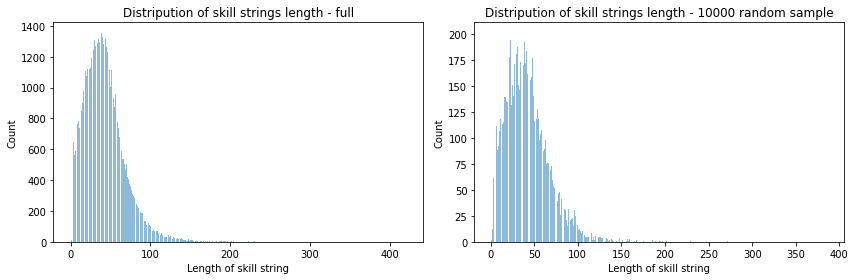

In [0]:
distribution_full = skills_embeddings_dict["all"] \
            .withColumn("sentence_length", F.length(F.col("sentence"))) \
            .groupBy("sentence_length").count().orderBy("sentence_length").toPandas()
distribution_sample = skills_embeddings_sample \
            .withColumn("sentence_length", F.length(F.col("sentence"))) \
            .groupBy("sentence_length").count().orderBy("sentence_length").toPandas()

fig, axs = plt.subplots(1, 2, figsize=(12, 4))
axs[0].bar(distribution_full["sentence_length"], distribution_full["count"], align="center", alpha=0.5)
axs[0].set_xlabel("Length of skill string")
axs[0].set_ylabel("Count")
axs[0].set_title("Distripution of skill strings length - full")
axs[1].bar(distribution_sample["sentence_length"], distribution_sample["count"], align="center", alpha=0.5)
axs[1].set_xlabel("Length of skill string")
axs[1].set_ylabel("Count")
axs[1].set_title("Distripution of skill strings length - 10000 random sample")
plt.tight_layout()
plt.show()

In [0]:
skills_embeddings_sample.filter(F.length("sentence") > 100).count() # Noise

Out[86]: 172

In [0]:
skills_embeddings_sample = skills_embeddings_sample.filter(F.length("sentence") <= 100)
skills_embeddings_sample.count()

Out[87]: 9751

### Skills: Clustering

#### Clustering a 10000 sample

In [0]:
skills_clusters, skills_clusterer = hdbscan_clustering(skills_embeddings_sample, spark, metric='euclidean', min_samples=2, min_cluster_size=3, cluster_selection_method='leaf', cluster_selection_epsilon=0, prediction_data=True, pca=False, pca_k=200)

Silhouette score: -0.20135936830266293
Calinski-Harabasz score: 3.995725386410763
Davies-Bouldin score: 1.7765990199435984
DBCV relative score: 0.042432371622517756
Number of clusters: 236
Number of unique sentences clustered: 1214


### Saving The Clusterer Model

In [0]:
joblib.dump(skills_clusterer, "/Workspace/Users/vladklim@campus.technion.ac.il/Project/models/skills_clusterer.joblib")

Out[91]: ['/Workspace/Users/vladklim@campus.technion.ac.il/Project/models/skills_clusterer.joblib']

In [0]:
skills_clusters_layered = create_layers(skills_clusters, spark, min_=1, max_=5, min_word_len=1, lemmatize=False, start_from=1)

In [0]:
skills_clusters_layered.select("sentence", "soft_cluster", "layer_4", "layer_3", "layer_2", "layer_1", "layer_0") \
                        .orderBy(F.desc("layer_4"), F.desc("soft_cluster")).display()

sentence,soft_cluster,layer_4,layer_3,layer_2,layer_1,layer_0
A minimum of two years directly managing people and/or teams.,185,years,"years, environments","years, environments, agile","years, environments, agile, scrum","years, environments, agile, scrum, ability"
Extensive experience in managing desktop environments,185,years,"years, environments","years, environments, agile","years, environments, agile, scrum","years, environments, agile, scrum, ability"
Scrum/Agile experience,185,years,"years, environments","years, environments, agile","years, environments, agile, scrum","years, environments, agile, scrum, ability"
Exhibit the ability to live the KGPCo Values,185,years,"years, environments","years, environments, agile","years, environments, agile, scrum","years, environments, agile, scrum, ability"
Exhibit the ability to live the KGPCo Values,185,years,"years, environments","years, environments, agile","years, environments, agile, scrum","years, environments, agile, scrum, ability"
Demonstrated ability to communicate with employees,185,years,"years, environments","years, environments, agile","years, environments, agile, scrum","years, environments, agile, scrum, ability"
Demonstrated experience performing vulnerability assessments with the ACAS tool.,185,years,"years, environments","years, environments, agile","years, environments, agile, scrum","years, environments, agile, scrum, ability"
Demonstrated capabilities to work in a dynamic environment,185,years,"years, environments","years, environments, agile","years, environments, agile, scrum","years, environments, agile, scrum, ability"
At least 10 years of directly relevant IP litigation experience,185,years,"years, environments","years, environments, agile","years, environments, agile, scrum","years, environments, agile, scrum, ability"
Demonstrated experience working in a Scrum/Agile environment,185,years,"years, environments","years, environments, agile","years, environments, agile, scrum","years, environments, agile, scrum, ability"


In [0]:
print(skills_clusters_layered.select("soft_cluster").distinct().count())
print(skills_clusters_layered.select("layer_0").distinct().count())
print(skills_clusters_layered.select("layer_1").distinct().count())
print(skills_clusters_layered.select("layer_2").distinct().count())
print(skills_clusters_layered.select("layer_3").distinct().count())
print(skills_clusters_layered.select("layer_4").distinct().count())

236
236
236
236
226
151


In [0]:
skills_clusters_tsne = get_tsne_embeddings(skills_clusters_layered, spark, perplexity=50, metric="euclidean")

In [0]:
save_vis_data(skills_clusters_tsne, "skills_data")

## Exploring the clustering results

In [0]:
clusters = titles_clusters_tsne.select("cluster").rdd.map(lambda x: x["cluster"]).collect()
probs = titles_clusters_tsne.select("probability").rdd.map(lambda x: x["probability"]).collect()
soft_clusters = titles_clusters_tsne.select("soft_cluster").rdd.map(lambda x: x["soft_cluster"]).collect()
soft_probs = titles_clusters_tsne.select("soft_probability").rdd.map(lambda x: x["soft_probability"]).collect()
tsne_vectors = titles_clusters_tsne.select("vector_TSNE").rdd.map(lambda x: x["vector_TSNE"]).collect()

In [0]:
largest_clusters = [x[0] for x in sorted(Counter(soft_clusters).items(), key=lambda item: item[1], reverse=True)][:5]

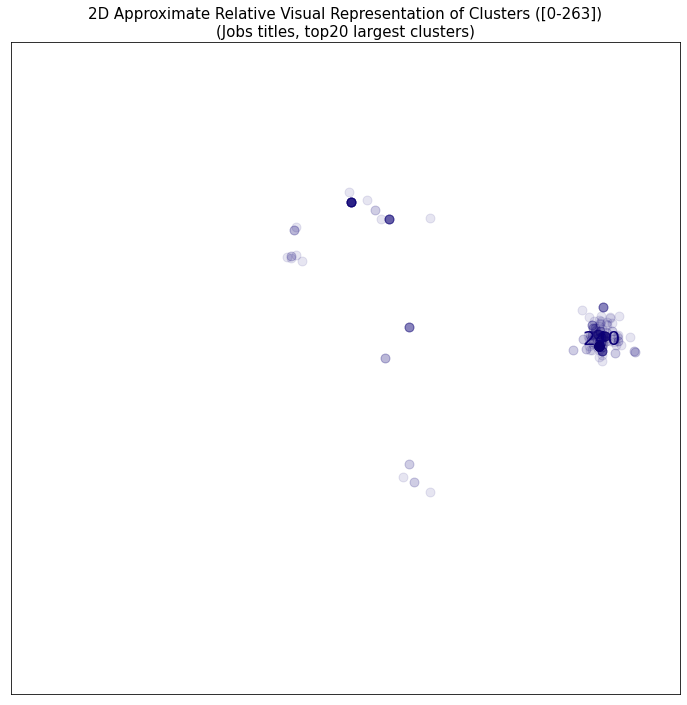

In [0]:
visualize_tsne_clusters(tsne_vectors, clusters, probs,
                        soft_clusters=soft_clusters, soft_probs=soft_probs, cent_prob=0.98,
                        satur_accent=500, show_noise=False, show_simplices=True, show_soft_clusters=True, annotate=True, 
                        clusters_to_show=largest_clusters[:1], subtitle="Jobs titles, top20 largest clusters", s=80, fontsize=20, fig_size=(12, 12))

In [0]:
sns.distplot(titles_clusterer.outlier_scores_[np.isfinite(titles_clusterer.outlier_scores_)], rug=True)

In [0]:
threshold = pd.Series(titles_clusterer.outlier_scores_).quantile(0.9)
outliers = np.where(titles_clusterer.outlier_scores_ > threshold)[0]
plt.figure(figsize=(10, 7))
pal = sns.color_palette('deep', 27)
colors = [sns.desaturate(pal[col], sat) for col, sat in zip(titles_clusterer.labels_,
                                                            titles_clusterer.probabilities_)]
plt.scatter(titles_tnse_vectors.T[0], titles_tnse_vectors.T[1], c=colors, alpha=0.5)
# plt.scatter(*titles_tnse_vectors.T, s=50, linewidth=0, c='gray', alpha=0.25)
plt.scatter(*titles_tnse_vectors[outliers].T, s=50, linewidth=0, c='red', alpha=1)

In [0]:
titles_clusters.display()

In [0]:
titles_clusters.select("soft_cluster").groupBy("soft_cluster").agg(F.count("soft_cluster")).orderBy(F.desc("count(soft_cluster)")).display()

soft_cluster,count(soft_cluster)
237,260
253,235
255,217
256,184
231,180
242,164
179,154
173,154
245,148
251,144


In [0]:
window_spec = Window.partitionBy('soft_cluster').orderBy(F.desc(F.col('soft_probability')))
max_sim_df = titles_clusters.select("*", F.row_number().over(window_spec).alias('row_number'))
max_sim_rows = max_sim_df.filter(F.col('row_number').isin([1, 2, 3, 4, 5]))
max_sim_rows.select("sentence", "cluster", "soft_cluster", "probability", "soft_probability").display()

In [0]:
titles_clusters.select("sentence", "soft_cluster", "cluster", "probability", "soft_probability").filter(F.col("soft_cluster") \
                .isin([87,91])).orderBy("soft_cluster", F.desc("soft_probability")).display()

sentence,soft_cluster,cluster,probability,soft_probability
System Administrator III,87,87,1.0,1.0
System Administrator II,87,87,1.0,1.0
Systems Administrator I-III,87,87,1.0,1.0
Purchasing Specialist III-IV,87,-1,0.0,0.006369694152981262
Customer Service/Order Entry III,87,-1,0.0,0.005466733840868384
System Administrator Tier II,87,-1,0.0,0.005246281568022911
Managed Services - Tier III,87,-1,0.0,0.005151229629480184
Managed Services - Tier III,87,-1,0.0,0.005151229629480184
Managed Services - Tier III,87,-1,0.0,0.005151229629480184
Managed Services - Tier III,87,-1,0.0,0.005151229629480184


# Not relevant

In [0]:
companies = spark.read.parquet('/linkedin/companies')
tech_comps = companies.join(jobs_parsed_df, ("url"), "inner")